# Pure MST Linker Results Visualization

Using `PureMstLinker` to perform the complete pipeline (preprocessing + MST reconstruction) from three raw inputs (image / mask / annotation) and visualize the results.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import networkx as nx
from pathlib import Path
import pandas as pd

from neural_reconstruction.algorithms.fragment_linking.linker import HierarchicalFragmentLinker
from neural_reconstruction.core.preprocessing import SkinAnalysisPipeline
from neural_reconstruction.core.topology import TopologyBuilder
from neural_reconstruction.core.pathfinding import PathFinder
from neural_reconstruction.algorithms.fragment_linking.utils import compute_vector_angle,is_direction_too_similar

import skimage as ski
# from skimage.measure import label
# from skimage.restoration import rolling_ball
from scipy.spatial import KDTree

from xgboost import XGBClassifier
import joblib


In [2]:
BASE_PATH = Path('/home/pony/projects/ienf_q/')
IMAGE_ID = 'S1616-2_a'
BASE_PATH = BASE_PATH / f'nas/jia/data_0320/{IMAGE_ID}'

## 1. Load Input Data

In [3]:
image      = cv2.imread(f'{BASE_PATH}/image.png',      cv2.IMREAD_COLOR_RGB)[:, :, 1]  # 只取綠色通道
mask       = cv2.imread(f'{BASE_PATH}/mask.png',       cv2.IMREAD_GRAYSCALE)
annotation = cv2.imread(f'{BASE_PATH}/weka.png', cv2.IMREAD_GRAYSCALE)

print(f'image      shape: {image.shape},      dtype: {image.dtype}')
print(f'mask       shape: {mask.shape},       dtype: {mask.dtype}')
print(f'annotation shape: {annotation.shape}, dtype: {annotation.dtype}')

# _, axes = plt.subplots(3, 1, figsize=(18, 6), constrained_layout=True)
# axes[0].imshow(image,      cmap='gray');  axes[0].set_title('Image');       axes[0].axis('off')
# axes[1].imshow(mask,       cmap='gray');  axes[1].set_title('Mask');        axes[1].axis('off')
# axes[2].imshow(annotation, cmap='gray');  axes[2].set_title('Annotation');  axes[2].axis('off')
# plt.show()

image      shape: (2048, 7577),      dtype: uint8
mask       shape: (2048, 7577),       dtype: uint8
annotation shape: (2048, 7577), dtype: uint8


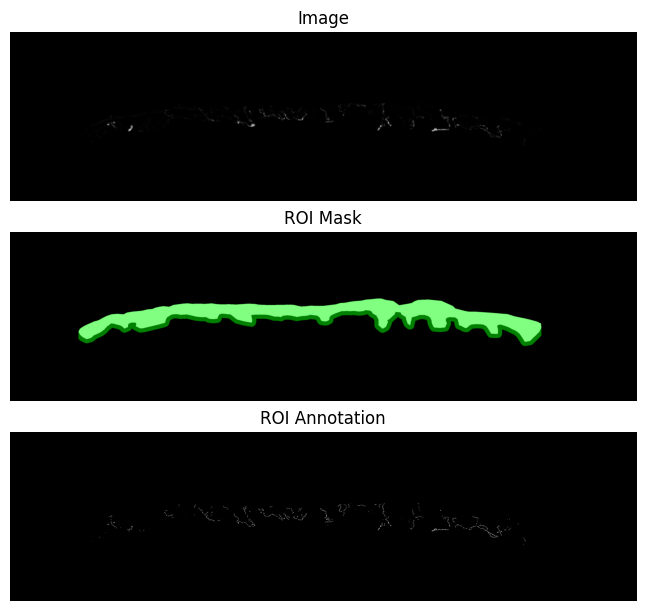

In [4]:
from neural_reconstruction.core.preprocessing import dilate_epidermis_vertically

roi_mask = dilate_epidermis_vertically(mask, offset_px=50)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (51, 51))
background = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
image = cv2.subtract(image, background)

roi_image = cv2.bitwise_and(image, image, mask=roi_mask)
roi_annotation = cv2.bitwise_and(annotation, annotation, mask=roi_mask)

# apply opening to roi_annotation to remove small noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
roi_annotation = cv2.morphologyEx(roi_annotation, cv2.MORPH_OPEN, kernel)

# apply closing to roi_annotation to fill small holes
roi_annotation = cv2.morphologyEx(roi_annotation, cv2.MORPH_CLOSE, kernel)


viz_mask = cv2.cvtColor(roi_mask, cv2.COLOR_GRAY2RGB)
viz_mask[:, :, 0] = 0  # 去掉紅色通道
viz_mask[:, :, 2] = 0  # 去掉藍色通道
viz_mask = cv2.addWeighted(viz_mask, 0.5, cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB), 0.5, 0)
_, axes = plt.subplots(3, 1, figsize=(18, 6), constrained_layout=True)
axes[0].imshow(roi_image,      cmap='gray');  axes[0].set_title('Image');       axes[0].axis('off')
axes[1].imshow(viz_mask);  axes[1].set_title('ROI Mask');    axes[1].axis('off')
axes[2].imshow(roi_annotation, cmap='gray');  axes[2].set_title('ROI Annotation');  axes[2].axis('off')
plt.show()

In [5]:
R=50
from neural_reconstruction.core.preprocessing import SkinAnalysisPipeline
from neural_reconstruction.core.topology import TopologyBuilder
from neural_reconstruction.core.pathfinding import PathFinder
from skimage.measure import label
from scipy.spatial import KDTree


labeled = np.asarray(label(roi_annotation, connectivity=2))

# 2. 骨架化 + 種子切分
topology_builder = TopologyBuilder(segment_length=3.0)
global_graph = topology_builder.build_seed_graph(roi_annotation, roi_image)

# 從 labeled image 補上 component_id
for node in global_graph.nodes():
    y, x = node
    global_graph.nodes[node]["component_id"] = int(labeled[int(y), int(x)])

# 元件內邊設低成本
for u, v, data in global_graph.edges(data=True):
    data["weight"] = 1e-5

# 3. 元件間路徑查找
cost_map = ((255 - roi_image.astype(np.float64)) / 255) ** 2


path_finder = PathFinder(cost_map)
topology_points = np.array(list(global_graph.nodes()))

kdtree = KDTree(topology_points)
component_ids = np.array(
    [global_graph.nodes[tuple(p)]["component_id"] for p in topology_points]
)

processed_pairs: set = set()
for i, source in enumerate(topology_points):
    source_comp = component_ids[i]
    neighbor_indices = np.array(
        kdtree.query_ball_point(source, r=R), dtype=np.int32
    )

    # Filter: exclude self and same component
    valid_mask = (neighbor_indices != i) & (
        component_ids[neighbor_indices] != source_comp
    )
    valid_indices = neighbor_indices[valid_mask]

    targets = []
    for j in valid_indices:
        pair = (min(i, j), max(i, j))
        if pair not in processed_pairs:
            processed_pairs.add(pair)
            targets.append(tuple(topology_points[j].astype(int)))

    if not targets:
        continue

    paths = path_finder.find_paths_from_source(
        tuple(source.astype(int)), targets
    )
    for target_pos, result in paths.items():
        if result is None:
            continue
        path, cost = result
        global_graph.add_edge(
            tuple(source.astype(int)), target_pos, weight=cost, path=path
        )
mst_forest = nx.minimum_spanning_tree(global_graph, weight="weight")

print(f'Nodes: {mst_forest.number_of_nodes()}')
print(f'Edges: {mst_forest.number_of_edges()}')
print(f'Connected components: {nx.number_connected_components(mst_forest)}')

/home/pony/projects/ienf_q/src/neural_reconstruction/core/topology/topology_builder.py:125: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(skel_obj)


Nodes: 2691
Edges: 2659
Connected components: 32


In [6]:
res_graph = mst_forest

In [7]:
def draw_mst_on_ax(ax, background, mst_forest, edge_color='lime', node_color='cyan',
                   linewidth=1, node_size=1.2, show_nodes=True):
    ax.imshow(background, cmap='gray' if background.ndim == 2 else None)
    for u, v, data in mst_forest.edges(data=True):
        path = data.get('path', [u, v])
        if len(path) < 2:
            continue
        ax.plot([p[1] for p in path], [p[0] for p in path],
                color=edge_color, linewidth=linewidth, alpha=0.85)
    if show_nodes:
        for node in mst_forest.nodes():
            ax.plot(node[1], node[0], '.', color=node_color, markersize=node_size)

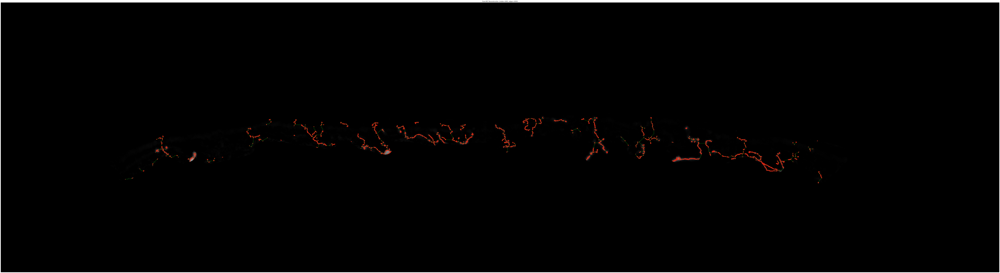

In [8]:
fig, axes = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

viz_image = cv2.cvtColor(roi_image, cv2.COLOR_GRAY2RGB)
viz_image[roi_annotation > 0] = [255, 0, 0]
draw_mst_on_ax(axes, viz_image, res_graph)
axes.set_title(f'Pure MST Reconstruction  (nodes={res_graph.number_of_nodes()}, edges={res_graph.number_of_edges()})')
axes.axis('off')

plt.show()

In [9]:
from neural_reconstruction.core.topology import TopologyBuilder
from neural_reconstruction.core.evaluation import extract_graph_points, compute_average_hausdorff_distance

# 從 label.png 建構 GT 拓樸
label_img = cv2.imread(f'{BASE_PATH / "label.png"}', cv2.IMREAD_GRAYSCALE)

gt_builder = TopologyBuilder()
roi_label = cv2.bitwise_and(label_img, label_img, mask=roi_mask)
gt_graph = gt_builder.build_seed_graph(roi_label)

print(f'GT  — Nodes: {gt_graph.number_of_nodes()}, Edges: {gt_graph.number_of_edges()}')
print(f'Pred — Nodes: {res_graph.number_of_nodes()}, Edges: {res_graph.number_of_edges()}')

# 展開成點集（nodes + edge path 上的所有點）
pred_points = extract_graph_points(res_graph)
gt_points   = extract_graph_points(gt_graph)

print(f'\nPoint count after expanding edge paths:')
print(f'  Pred: {len(pred_points)} pts')
print(f'  GT  : {len(gt_points)} pts')

GT  — Nodes: 2637, Edges: 2589
Pred — Nodes: 2691, Edges: 2659

Point count after expanding edge paths:
  Pred: 10371 pts
  GT  : 6901 pts


/home/pony/projects/ienf_q/src/neural_reconstruction/core/topology/topology_builder.py:125: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(skel_obj)


In [10]:
avg_dist, d_pred_to_gt, d_gt_to_pred = compute_average_hausdorff_distance(
    pred_points, gt_points
)

print('=== Average Hausdorff Distance ===')
print(f'Avg Hausdorff Distance : {avg_dist:.4f} px')
print(f'  Pred → GT            : {d_pred_to_gt:.4f} px')
print(f'  GT   → Pred          : {d_gt_to_pred:.4f} px')

=== Average Hausdorff Distance ===
Avg Hausdorff Distance : 10.0405 px
  Pred → GT            : 18.1062 px
  GT   → Pred          : 1.9748 px


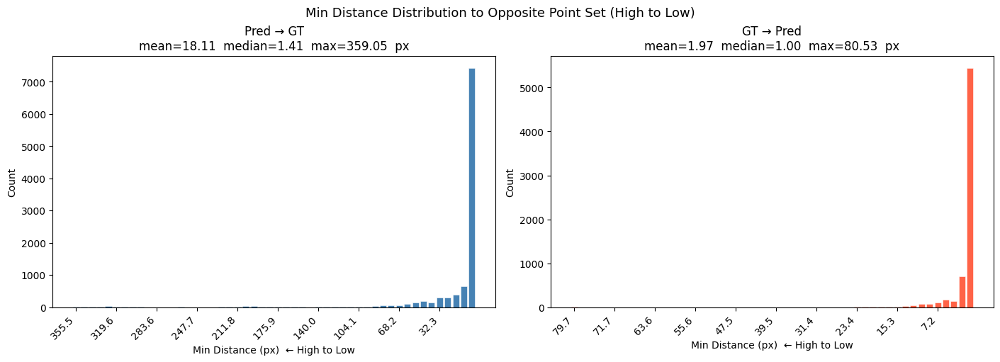

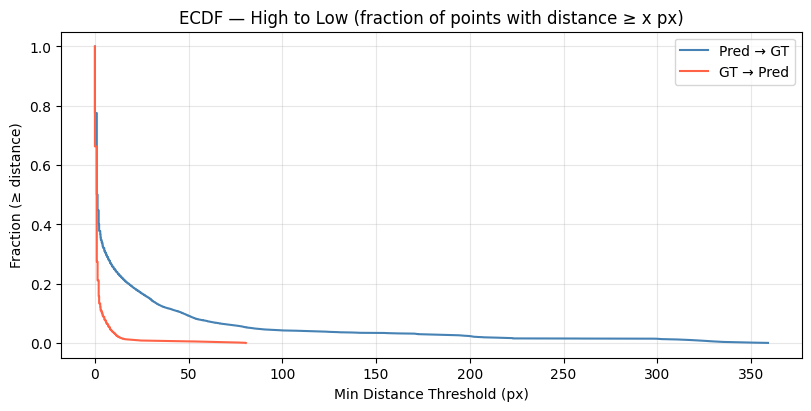

In [11]:
from neural_reconstruction.core.evaluation import compute_point_min_distances

min_pred_to_gt, min_gt_to_pred = compute_point_min_distances(pred_points, gt_points)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

BINS = 50

for ax, dists, label, color in [
    (axes[0], min_pred_to_gt, 'Pred → GT', 'steelblue'),
    (axes[1], min_gt_to_pred, 'GT → Pred', 'tomato'),
]:
    counts, edges = np.histogram(dists, bins=BINS)
    # Sort bins from high to low distance
    centers = (edges[:-1] + edges[1:]) / 2
    order   = np.argsort(centers)[::-1]
    ax.bar(range(BINS), counts[order], color=color, edgecolor='white', linewidth=0.4)
    ax.set_xticks(range(0, BINS, 5))
    ax.set_xticklabels([f'{centers[order][i]:.1f}' for i in range(0, BINS, 5)], rotation=45, ha='right')
    ax.set_xlabel('Min Distance (px)  ← High to Low')
    ax.set_ylabel('Count')
    ax.set_title(f'{label}\n'
                 f'mean={np.mean(dists):.2f}  median={np.median(dists):.2f}  '
                 f'max={np.max(dists):.2f}  px')

fig.suptitle('Min Distance Distribution to Opposite Point Set (High to Low)', fontsize=13)
plt.show()

# ECDF — useful for checking what fraction of points have error within a threshold
fig, ax = plt.subplots(figsize=(8, 4), constrained_layout=True)
for dists, label, color in [
    (min_pred_to_gt, 'Pred → GT', 'steelblue'),
    (min_gt_to_pred, 'GT → Pred', 'tomato'),
]:
    sorted_d = np.sort(dists)[::-1]          # High to low
    ecdf     = np.arange(1, len(sorted_d)+1) / len(sorted_d)
    ax.plot(sorted_d, ecdf, label=label, color=color)

ax.set_xlabel('Min Distance Threshold (px)')
ax.set_ylabel('Fraction (≥ distance)')
ax.set_title('ECDF — High to Low (fraction of points with distance ≥ x px)')
ax.legend()
ax.grid(True, alpha=0.3)
plt.show()

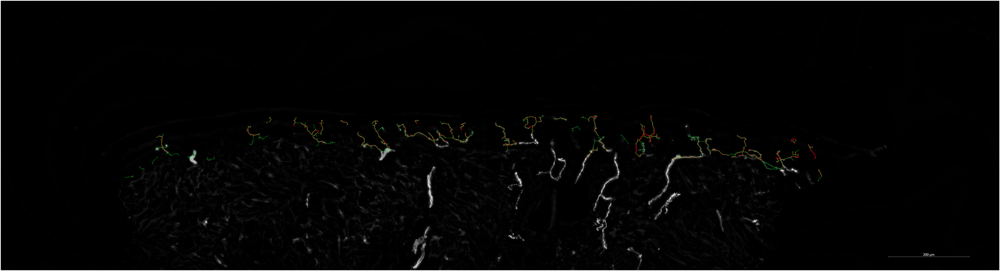

In [12]:
fig, axes = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

# axes[0].imshow(image, cmap='gray')
# axes[0].imshow(np.ma.masked_where(annotation == 0, annotation), cmap='Reds', alpha=0.7)
# axes[0].set_title('原始 Annotation')
# axes[0].axis('off')

draw_mst_on_ax(axes, image, gt_graph, edge_color='red', node_color='magenta',
               linewidth=4, node_size=1)
draw_mst_on_ax(axes, image, res_graph,linewidth=2, node_size=1)

axes.axis('off')
plt.savefig('mst_comparison.png')
plt.show()

In [13]:
from neural_reconstruction.core.crosses_detection import RegionLabeler, SegmentDetector, CrossingCounter
from collections import defaultdict

region_labeler = RegionLabeler()
segment_detector = SegmentDetector()
crossing_counter = CrossingCounter()

# Step 1: Detect segments (must run before RegionLabeler — segment_id is needed by label_topology)
segmented_graph = segment_detector.detect_segments(res_graph)

# Step 1b: Remove short stub segments (total path length < 5 px, with at least one endpoint)
def _path_length(data, u, v):
    path = data.get('path', [u, v])
    return len(path) - 1  # number of pixel steps

seg_edges = defaultdict(list)
for u, v, data in segmented_graph.edges(data=True):
    seg_id = data.get('segment_id')
    if seg_id is not None:
        seg_edges[seg_id].append((u, v, data))

edges_to_remove = []
for seg_id, edges in seg_edges.items():
    # Collect boundary nodes of this segment
    boundary_nodes = set()
    for u, v, _ in edges:
        if segmented_graph.nodes[u].get('node_type') in ('endpoint', 'branchpoint'):
            boundary_nodes.add(u)
        if segmented_graph.nodes[v].get('node_type') in ('endpoint', 'branchpoint'):
            boundary_nodes.add(v)

    # Only prune if at least one boundary node is an endpoint (dangling stub)
    has_endpoint = any(
        segmented_graph.nodes[n].get('node_type') == 'endpoint'
        for n in boundary_nodes
    )
    if not has_endpoint:
        continue

    total_length = sum(_path_length(data, u, v) for u, v, data in edges)
    if total_length < 5:
        edges_to_remove.extend((u, v) for u, v, _ in edges)

segmented_graph.remove_edges_from(edges_to_remove)
segmented_graph.remove_nodes_from(list(nx.isolates(segmented_graph)))
print(f'Pruned {len(edges_to_remove)} stub edges → '
      f'{segmented_graph.number_of_nodes()} nodes, {segmented_graph.number_of_edges()} edges')

segmented_graph = segment_detector.detect_segments(segmented_graph)
# Step 2: Label regions and mark crossing edges
labeled_graph, _ = region_labeler.label_topology(segmented_graph, mask)

# Step 3: Count effective crossings
result = crossing_counter.count_effective_crossings(labeled_graph)

print(crossing_counter.get_crossing_summary(result))

Pruned 220 stub edges → 2465 nodes, 2439 edges
=== Nerve Fiber Crossing Summary ===
Total segments:              291
Segments with crossings:     39
Total crossing edges (raw):  46
Effective crossings (dedup): 39


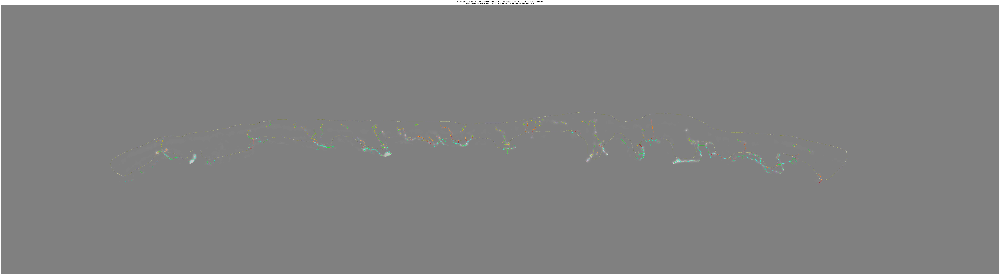

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

# Base image
viz_image = cv2.cvtColor(roi_image, cv2.COLOR_GRAY2RGB)

# Collect crossing segment IDs
crossing_seg_ids = {
    d['segment_id'] 
    for d in result['segment_details']
    if d['has_crossing']
}

# Draw all edges, coloured by crossing status
for u, v, data in labeled_graph.edges(data=True):
    path = data.get('path', [u, v])
    if len(path) < 2:
        continue
    xs = [p[1] for p in path]
    ys = [p[0] for p in path]
    is_crossing_seg = data.get('segment_id') in crossing_seg_ids
    color = 'red' if is_crossing_seg else 'lime'
    ax.plot(xs, ys, color=color, linewidth=1.5, alpha=0.85)

# Draw nodes
for node in labeled_graph.nodes():
    region = labeled_graph.nodes[node].get('region', 'dermis')
    color = 'orange' if region == 'epidermis' else 'cyan'
    ax.plot(node[1], node[0], '.', color=color, markersize=3)

# Overlay epidermis mask boundary
mask_edge = cv2.Canny(mask, 50, 150)
ys_edge, xs_edge = np.where(mask_edge > 0)
ax.scatter(xs_edge, ys_edge, s=0.3, c='yellow', linewidths=0)

ax.imshow(viz_image, alpha=0.5)
ax.set_title(
    f'Crossing Visualization  |  '
    f'Effective crossings: {result["effective_crossing_count"]}  |  '
    f'Red = crossing segment, Green = non-crossing\n'
    f'Orange node = epidermis, Cyan node = dermis, Yellow line = mask boundary',
    fontsize=16
)
ax.axis('off')
plt.savefig('crossing_visualization.png', dpi=72, bbox_inches='tight')
# plt.show()

/tmp/ipykernel_813844/866860190.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = plt.cm.get_cmap('tab20', 20)


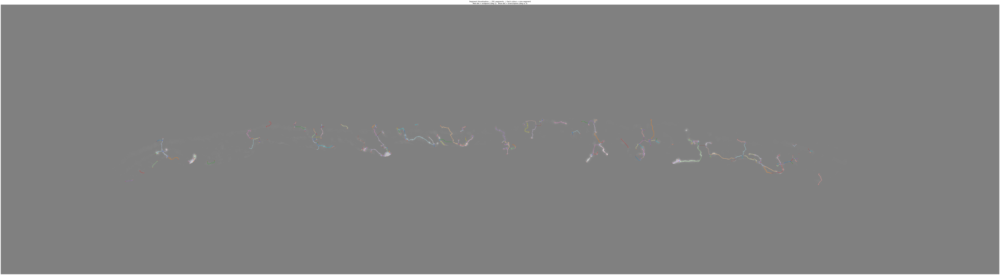

In [15]:
# Segment ID visualisation
# Each segment gets a unique colour; boundary nodes are marked by type.

seg_ids = sorted({
    d['segment_id']
    for _, _, d in segmented_graph.edges(data=True)
    if d.get('segment_id') is not None
})

# Build a colour palette that cycles through tab20 so nearby IDs look different
palette = plt.cm.get_cmap('tab20', 20)
seg_color = {sid: palette(i % 20) for i, sid in enumerate(seg_ids)}

fig, ax = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

viz = cv2.cvtColor(roi_image, cv2.COLOR_GRAY2RGB)
ax.imshow(viz, alpha=0.5)

# Draw edges coloured by segment_id
for u, v, data in segmented_graph.edges(data=True):
    path = data.get('path', [u, v])
    if len(path) < 2:
        continue
    sid = data.get('segment_id')
    color = seg_color.get(sid, (1, 1, 1, 1))
    ax.plot([p[1] for p in path], [p[0] for p in path],
            color=color, linewidth=2.0, alpha=0.9)

# Draw boundary nodes
for node in segmented_graph.nodes():
    ntype = segmented_graph.nodes[node].get('node_type')
    if ntype == 'endpoint':
        ax.plot(node[1], node[0], 'r.', markersize=4, zorder=5)
    elif ntype == 'branchpoint':
        ax.plot(node[1], node[0], 'b.', markersize=5, zorder=5)

ax.set_title(
    f'Segment Visualisation  |  {len(seg_ids)} segments  |  '
    'Each colour = one segment\n'
    'Red dot = endpoint (deg 1)   Blue dot = branchpoint (deg ≥ 3)',
    fontsize=16,
)
ax.axis('off')
plt.savefig('segment_visualization.png', dpi=72, bbox_inches='tight')
plt.show()